# Segment Anything Model (SAM)
## Интерактивная сегментация одним кликом

### План семинара:
1. Что такое SAM
2. Сегментация по точкам (point prompts)
3. Сегментация по боксам (box prompts)
4. Сегментация всего на изображении (automatic mask generation)
5. Комбинация промптов
6. Практическое применение

SAM: Модель обучена на 11 млн изображений и может сегментировать ЛЮБОЙ объект по простому указанию (клик, бокс, текст)!


In [1]:
# Установка библиотек
# !pip install segment-anything opencv-python matplotlib numpy torch torchvision
# from huggingface_hub import hf_hub_download
# hf_hub_download("ybelkada/segment-anything", "checkpoints/sam_vit_b_01ec64.pth", local_dir="")   
# print("✅ Библиотеки установлены, модель скачана")

In [2]:
# Импорт и настройка
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
from pathlib import Path
import requests
from PIL import Image
import io

# Настройка визуализации
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

print("✅ Готово к работе!")

✅ Готово к работе!


## 1. Загрузка модели и изображения

In [3]:
# Инициализация SAM
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🖥 Используем: {device}")

# Регистрируем модель (доступные: vit_h, vit_l, vit_b)
sam = sam_model_registry["vit_b"](checkpoint="checkpoints/sam_vit_b_01ec64.pth")
sam.to(device=device)
predictor = SamPredictor(sam)

print(f"✅ SAM загружен на {device}")

🖥 Используем: cuda
✅ SAM загружен на cuda


Размер изображения: (1200, 1800, 3)


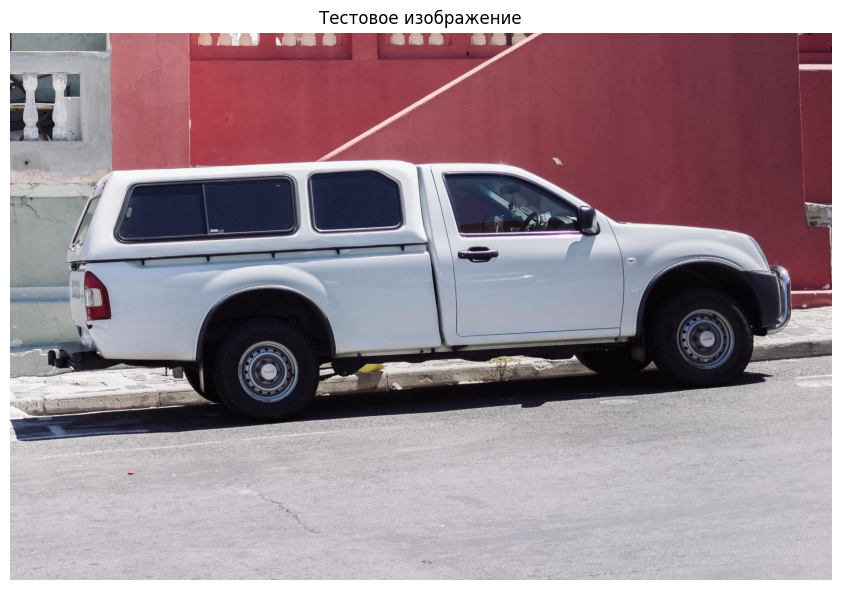

In [4]:
# Загружаем тестовое изображение
# Можно заменить на свое: image = cv2.imread("path/to/image.jpg")

url = "https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg"
response = requests.get(url)
image = np.array(Image.open(io.BytesIO(response.content)))

# Или загрузить свое изображение:
# image = cv2.imread("your_image.jpg")
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(f"Размер изображения: {image.shape}")

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis("off")
plt.title("Тестовое изображение")
plt.tight_layout()
plt.show()

In [5]:
# Устанавливаем изображение в predictor (это нужно сделать один раз)
predictor.set_image(image)
print("✅ Изображение установлено в модель")

✅ Изображение установлено в модель


## 2. Сегментация по ТОЧКАМ (Point Prompts)

### Задание 2.1: Сегментация объекта по одной точке

Укажите координаты точки (x, y) внутри объекта, который хотите выделить.

Найдено масок: 3
Scores: [0.9052787  0.95115465 0.9838543 ]


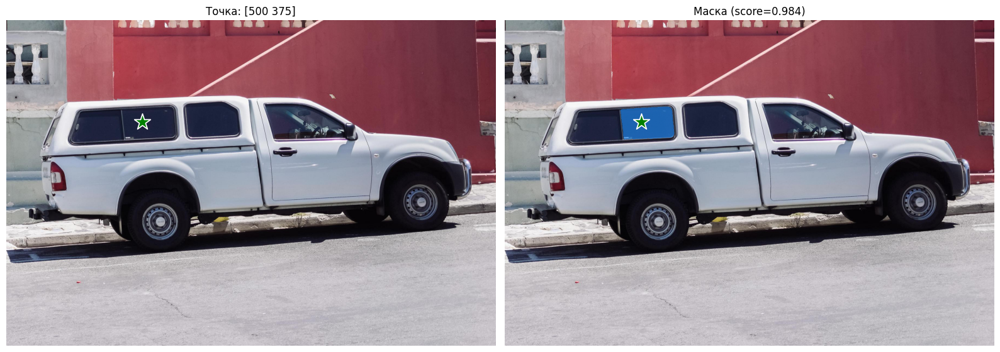

In [6]:
# Задаем точку (координаты x, y)
# Например, для грузовика: колесо, кабина, фара
input_point = np.array([[500, 375]])  # Координаты точки [x, y]
input_label = np.array([1])  # 1 = объект, 0 = фон

# Предсказание
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True  # Вернуть несколько вариантов
)

print(f"Найдено масок: {len(masks)}")
print(f"Scores: {scores}")

# Визуализация лучшей маски
best_mask_idx = np.argmax(scores)

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], c='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], c='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
show_points(input_point, input_label, ax[0])
ax[0].set_title(f"Точка: {input_point[0]}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[best_mask_idx], ax[1])
show_points(input_point, input_label, ax[1])
ax[1].set_title(f"Маска (score={scores[best_mask_idx]:.3f})", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### 📝 Задание 2.2: Эксперимент с точками

Попробуйте:
1. Сегментировать колесо грузовика (поставьте точку на колесе)
2. Сегментировать кабину (точка на кабине)
3. Сегментировать фару (точка на фаре)
4. Попробуйте указать точку фона (label=0) и посмотрите, что произойдет

Вопросы для размышления:**
- Почему иногда SAM выдает несколько масок для одной точки?  
**Ответ:** SAM генерирует несколько масок для разрешения неоднозначности, вызванной тем, что одна точка может принадлежать разным уровням иерархии объекта — например, колесу, колесной арке или всему грузовику, — и предлагает пользователю выбрать наиболее подходящий вариант.
- Как меняется результат в зависимости от расположения точки?  
**Ответ:** При размещении точки в центре однородной области маска получается уверенной и целостной, тогда как точка на границе или краю объекта приводит к нестабильным результатам с высоким разбросом scores среди трех масок из-за неоднозначности принадлежности пикселя к объекту или фону.

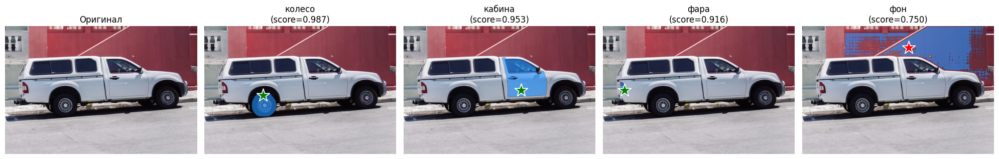

Получено 4 отдельных масок


In [7]:
# Список точек для разных объектов
objects = [
    {"name": "колесо", "point": [550, 650], "label": 1},
    {"name": "кабина", "point": [1100, 600], "label": 1},
    {"name": "фара", "point": [200, 600], "label": 1},
    {"name": "фон", "point": [1000, 200], "label": 0},
]

# Создаем subplot сетку: 1 строка, N+1 колонок
fig, axes = plt.subplots(1, len(objects) + 1, figsize=(20, 6))

# Оригинальное изображение
axes[0].imshow(image)
axes[0].set_title("Оригинал", fontsize=12)
axes[0].axis("off")

# Для каждого объекта получаем маску
all_masks = []
all_scores = []

for idx, obj in enumerate(objects):
    point = np.array([obj["point"]])
    label = np.array([obj["label"]])
    
    # Предсказание для одной точки
    masks, scores, _ = predictor.predict(
        point_coords=point,
        point_labels=label,
        multimask_output=True
    )
    
    best_idx = np.argmax(scores)
    best_mask = masks[best_idx]
    best_score = scores[best_idx]
    
    all_masks.append(best_mask)
    all_scores.append(best_score)
    
    # Визуализация маски
    axes[idx + 1].imshow(image)
    show_mask(best_mask, axes[idx + 1])
    show_points(point, label, axes[idx + 1])
    axes[idx + 1].set_title(f"{obj['name']}\n(score={best_score:.3f})", fontsize=12)
    axes[idx + 1].axis("off")

plt.tight_layout()
plt.show()

print(f"Получено {len(all_masks)} отдельных масок")

## 3. Сегментация по БОКСАМ (Box Prompts)

### Задание 3.1: Сегментация по bounding box

Задайте прямоугольник [x1, y1, x2, y2] вокруг объекта.

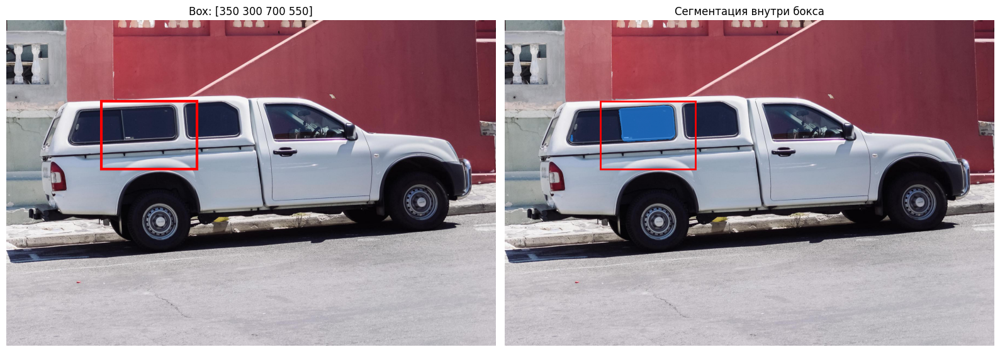

In [8]:
# Задаем bounding box [x1, y1, x2, y2]
input_box = np.array([350, 300, 700, 550])  # Пример: весь грузовик

# Предсказание
masks, scores, logits = predictor.predict(
    box=input_box[None, :],  # Добавляем размерность
    multimask_output=False
)

# Визуализация
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].add_patch(plt.Rectangle((input_box[0], input_box[1]), 
                               input_box[2]-input_box[0], 
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=3))
ax[0].set_title(f"Box: {input_box}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[0], ax[1])
ax[1].add_patch(plt.Rectangle((input_box[0], input_box[1]), 
                               input_box[2]-input_box[0], 
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=2))
ax[1].set_title("Сегментация внутри бокса", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 3.2: Сегментация нескольких объектов

Попробуйте задать несколько боксов для разных объектов одновременно!

📊 Найдено масок: 2


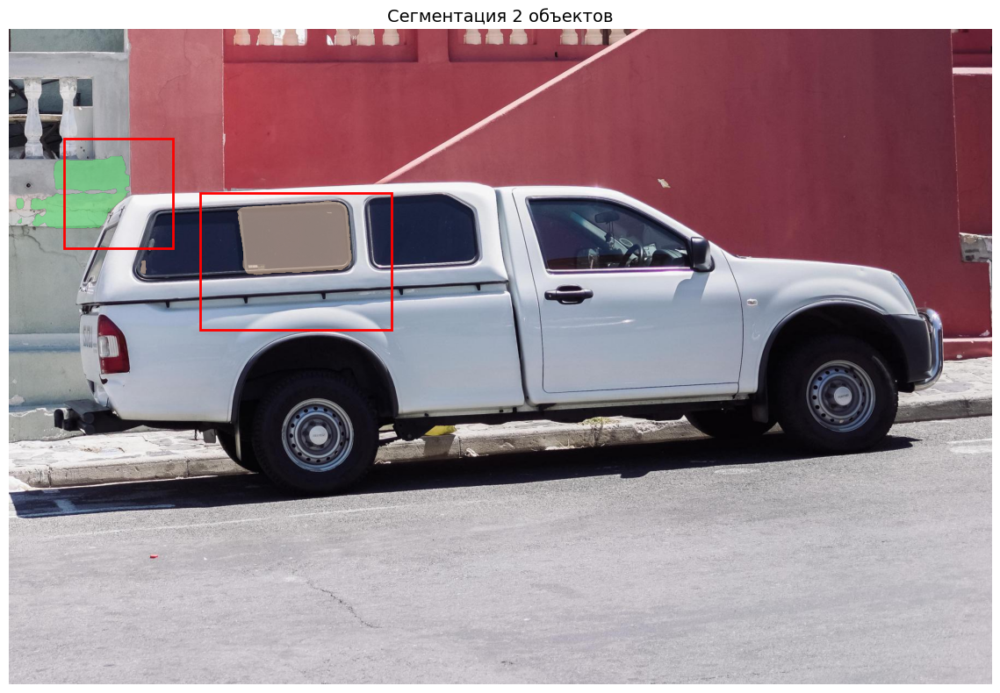

In [9]:
# 📦 Несколько боксов — вызываем predict для каждого отдельно
input_boxes = np.array([
    [350, 300, 700, 550],  # Грузовик
    [100, 200, 300, 400],  # Что-то еще на изображении
], dtype=np.float32)  # Важно: float32!

all_masks = []
all_scores = []

for box in input_boxes:
    masks, scores, logits = predictor.predict(
        box=box[None, :],  # Добавляем измерение батча (1, 4)
        multimask_output=False
    )
    all_masks.append(masks[0])
    all_scores.append(scores[0])

print(f"📊 Найдено масок: {len(all_masks)}")

# Визуализация
plt.figure(figsize=(12, 8))
plt.imshow(image)

for i, (mask, box) in enumerate(zip(all_masks, input_boxes)):
    show_mask(mask, plt.gca(), random_color=True)
    plt.gca().add_patch(plt.Rectangle((box[0], box[1]), 
                                       box[2]-box[0], box[3]-box[1],
                                       fill=False, edgecolor='red', linewidth=2))

plt.title(f"Сегментация {len(all_masks)} объектов", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

## 4. Автоматическая сегментация ВСЕГО (Automatic Mask Generation)

SAM может автоматически найти ВСЕ объекты на изображении без каких-либо промптов!

In [10]:
# Создаем автоматический генератор масок
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,  # Сколько точек генерировать на сторону (больше = точнее, но медленнее)
    pred_iou_thresh=0.86,  # Порог качества масок (0-1)
    stability_score_thresh=0.92,  # Порог стабильности
    crop_n_layers=1,  # Сколько слоев кропа использовать
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Минимальная площадь маски
)

print("✅ Генератор создан")

✅ Генератор создан


In [11]:
# Генерируем все маски (это может занять 10-30 секунд)
print("Генерируем маски...")
masks_auto = mask_generator.generate(image)

print(f"Найдено объектов: {len(masks_auto)}")
print(f"Средняя площадь маски: {np.mean([m['area'] for m in masks_auto]):.0f} пикселей")

Генерируем маски...


Найдено объектов: 83
Средняя площадь маски: 37228 пикселей


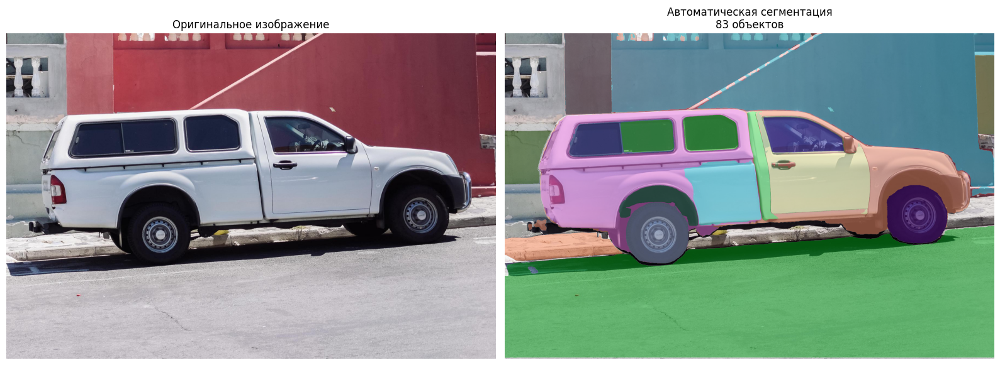

In [12]:
# Визуализация всех масок
def show_anns(anns, ax):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    
    ax.set_autoscale_on(False)
    img = np.ones((sorted_anns[0]['segmentation'].shape[0], 
                   sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    
    for ann in sorted_anns[:20]:  # Показываем топ-20 по площади
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask
    
    ax.imshow(img)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].set_title("Оригинальное изображение", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_anns(masks_auto, ax[1])
ax[1].set_title(f"Автоматическая сегментация\n{len(masks_auto)} объектов", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 4.1: Анализ автоматической сегментации

Попробуйте изменить параметры генератора:
1. `points_per_side=16` (быстрее, но менее точно)
2. `points_per_side=64` (медленнее, но детальнее)
3. `pred_iou_thresh=0.5` (больше масок, но больше шума)
4. `pred_iou_thresh=0.95` (только очень качественные маски)

Сравните количество и качество масок!

## 5. Практическое применение: Интерактивная сегментация

### Задание 5.1: Выделение объекта интереса

Представьте, что вы разрабатываете инструмент для дизайнеров. Пользователь кликает на объект, а SAM его выделяет.

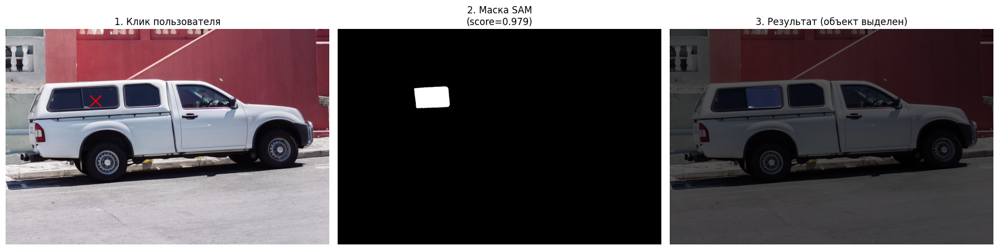

✅ Объект выделен! Площадь: 21535 пикселей


In [13]:
# Сценарий: Пользователь кликает на объект
# Симулируем клик пользователя (задайте координаты)
user_click = np.array([[500, 400]])  # Где кликнул пользователь
user_label = np.array([1])  # 1 = хочу выделить этот объект

# SAM находит объект
masks, scores, logits = predictor.predict(
    point_coords=user_click,
    point_labels=user_label,
    multimask_output=True
)

# Выбираем лучшую маску
best_idx = np.argmax(scores)
best_mask = masks[best_idx]

# Создаем маску для применения фильтров
masked_image = image.copy()
masked_image[~best_mask] = masked_image[~best_mask] // 3  # Затемняем фон

# Визуализация
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(image)
ax[0].scatter(user_click[:, 0], user_click[:, 1], c='red', s=200, marker='x')
ax[0].set_title("1. Клик пользователя", fontsize=12)
ax[0].axis("off")

ax[1].imshow(best_mask, cmap='gray')
ax[1].set_title(f"2. Маска SAM\n(score={scores[best_idx]:.3f})", fontsize=12)
ax[1].axis("off")

ax[2].imshow(masked_image)
ax[2].set_title("3. Результат (объект выделен)", fontsize=12)
ax[2].axis("off")

plt.tight_layout()
plt.show()

print(f"✅ Объект выделен! Площадь: {np.sum(best_mask)} пикселей")

## 6. Сравнение методов

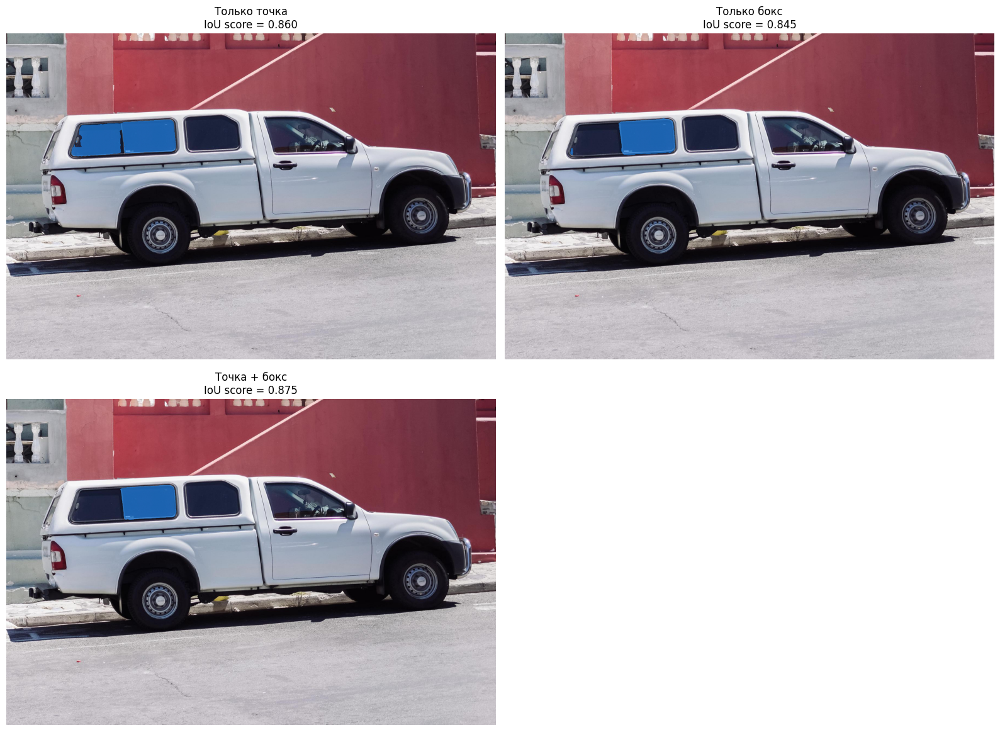

💡 Вывод: Комбинация промптов часто дает лучший результат!


In [14]:
# Сравним три подхода на одном объекте

# 1. Точка
point = np.array([[500, 375]])
masks_point, scores_point, _ = predictor.predict(
    point_coords=point, point_labels=np.array([1]), multimask_output=False
)

# 2. Бокс
box = np.array([350, 300, 700, 550])
masks_box, scores_box, _ = predictor.predict(
    box=box[None, :], multimask_output=False
)

# 3. Точка + бокс вместе!
masks_combined, scores_combined, _ = predictor.predict(
    point_coords=point,
    point_labels=np.array([1]),
    box=box[None, :],
    multimask_output=False
)

# Визуализация сравнения
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

methods = [
    ("Только точка", masks_point[0], scores_point[0]),
    ("Только бокс", masks_box[0], scores_box[0]),
    ("Точка + бокс", masks_combined[0], scores_combined[0]),
]

for idx, (title, mask, score) in enumerate(methods):
    ax = axes[idx // 2, idx % 2]
    ax.imshow(image)
    show_mask(mask, ax)
    ax.set_title(f"{title}\nIoU score = {score:.3f}", fontsize=12)
    ax.axis("off")

# Пустой subplot для красоты
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

print("💡 Вывод: Комбинация промптов часто дает лучший результат!")

## Домашнее Задание

**Задание 1: Интерактивный инструмент**

Создайте функцию, которая:
1. Принимает изображение и список точек (кликов пользователя)
2. Для каждой точки определяет, к какому объекту она относится
3. Возвращает:
   - Количество уникальных объектов, которые выделил пользователь
   - Общую площадь выделенных объектов
   - Визуализацию с разными цветами для каждого объекта

**Задание 2: Анализ качества**

1. Возьмите 3 разных изображения (природа, город, люди)
2. Для каждого изображения:
   - Запустите автоматическую сегментацию
   - Подсчитайте количество найденных объектов
   - Найдите средний IoU score
   - Сохраните статистику
3. Постройте график: "Тип изображения vs Количество объектов"
4. Сделайте вывод: на каких изображениях SAM работает лучше/хуже?

**Задание 3**

| Трек | Задание |
|------|---------|
| Creative** | Создайте "умное размытие фона": выделите главный объект точкой, размойте все остальное (эффект портретного режима) |
| Analytical | Реализуйте подсчет объектов определенного типа (например, "сколько машин на парковке") используя SAM + простые эвристики |
| Performance | Сравните скорость и качество трех моделей SAM: ViT-B, ViT-L, ViT-H. Постройте график "время vs качество" |


---

### Критерии оценки:
- Код работает без ошибок (20%)
- Правильное использование SAM API (30%)
- Качество визуализаций (20%)
- Глубина анализа и выводов (20%)
- Оформление и комментарии (10%)

### Формат сдачи:
- .ipynb файл с кодом и результатами
- 2-3 абзаца выводов
- Скриншоты результатов

## Полезные советы

### Частые проблемы:
1. CUDA out of memory → Используйте vit_b вместо vit_h, уменьшите `points_per_side`
2. Пустые маски → Проверьте, что точки/боксы внутри изображения
3. Медленная работа → Уменьшите `points_per_side` или используйте CPU для небольших изображений

### Ресурсы:
- [Официальный репозиторий SAM](https://github.com/facebookresearch/segment-anything)
[Demo SAM](https://segment-anything.com/demo) — попробуйте онлайн!
- [Paper SAM](https://arxiv.org/abs/2304.02643) — для тех, кто хочет понять internals
- [SA-1B Dataset](https://segment-anything.com/dataset/index.html) — 1.1 млрд масок!


### Задание 1

📊 РЕЗУЛЬТАТЫ:
   Количество уникальных объектов: 4
   Общая площадь выделенных объектов: 589650 пикселей
   Соответствие точек объектам: [0, 1, 2, 3]


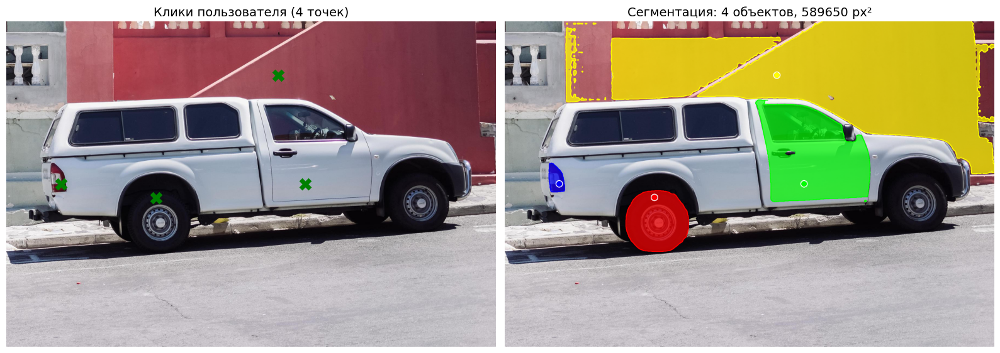

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def interactive_segmentation(image, points_with_labels):
    """
    Интерактивный инструмент сегментации по точкам пользователя.
    
    Args:
        image: входное изображение (numpy array)
        points_with_labels: список кортежей [(point, label), ...]
            point: [x, y] координаты клика
            label: 1 (объект) или 0 (фон)
    
    Returns:
        dict: {
            'num_unique_objects': количество уникальных объектов,
            'total_area': общая площадь выделенных объектов (пикселей),
            'visualization': изображение с цветной сегментацией,
            'masks': список масок для каждого уникального объекта,
            'object_ids': список ID объектов для каждой точки
        }
    """
    
    # Шаг 1: Группируем точки по объектам (на основе пространственной близости)
    # и для каждой точки получаем маску от SAM
    point_masks = []
    point_scores = []
    point_centers = []
    
    for point, label in points_with_labels:
        if label == 0:  # Фоновая точка пропускаем для сегментации объектов
            continue
            
        # Получаем маску для текущей точки
        masks, scores, _ = predictor.predict(
            point_coords=np.array([point]),
            point_labels=np.array([1]),
            multimask_output=True
        )
        
        best_idx = np.argmax(scores)
        best_mask = masks[best_idx]
        
        # Находим центр масс маски для сравнения
        y_coords, x_coords = np.where(best_mask)
        if len(y_coords) > 0:
            center = np.array([np.mean(x_coords), np.mean(y_coords)])
        else:
            center = np.array(point)
            
        point_masks.append(best_mask)
        point_scores.append(scores[best_idx])
        point_centers.append(center)
    
    # Шаг 2: Кластеризация масок по IoU (Intersection over Union)
    def compute_iou(mask1, mask2):
        intersection = np.logical_and(mask1, mask2).sum()
        union = np.logical_or(mask1, mask2).sum()
        return intersection / union if union > 0 else 0
    
    # Группируем похожие маски в объекты
    object_masks = []
    object_assignments = [-1] * len(point_masks)
    next_object_id = 0
    
    for i in range(len(point_masks)):
        if object_assignments[i] != -1:
            continue
            
        # Начинаем новый объект
        current_object_id = next_object_id
        next_object_id += 1
        object_assignments[i] = current_object_id
        current_mask = point_masks[i].copy()
        
        # Ищем маски, которые пересекаются с текущей
        for j in range(i + 1, len(point_masks)):
            if object_assignments[j] == -1:
                iou = compute_iou(current_mask, point_masks[j])
                if iou > 0.3:  # Порог схожести
                    object_assignments[j] = current_object_id
                    current_mask = np.logical_or(current_mask, point_masks[j])
        
        object_masks.append(current_mask)
    
    # Шаг 3: Вычисляем площади
    total_area = 0
    for mask in object_masks:
        total_area += np.sum(mask)
    
    # Шаг 4: Визуализация с разными цветами
    visualization = image.copy()
    
    # Генерируем разные цвета для каждого объекта
    colors = [
        np.array([255, 0, 0]),     # Красный
        np.array([0, 255, 0]),     # Зеленый
        np.array([0, 0, 255]),     # Синий
        np.array([255, 255, 0]),   # Желтый
        np.array([255, 0, 255]),   # Пурпурный
        np.array([0, 255, 255]),   # Голубой
        np.array([255, 128, 0]),   # Оранжевый
        np.array([128, 0, 255])    # Фиолетовый
    ]
    
    for obj_id, mask in enumerate(object_masks):
        color = colors[obj_id % len(colors)]
        
        # Накладываем цветную маску с прозрачностью
        for c in range(3):
            visualization[:, :, c] = np.where(
                mask,
                visualization[:, :, c] * 0.3 + color[c] * 0.7,
                visualization[:, :, c]
            )
        
        # Рисуем контуры объектов
        contours, _ = cv2.findContours(
            mask.astype(np.uint8), 
            cv2.RETR_EXTERNAL, 
            cv2.CHAIN_APPROX_SIMPLE
        )
        cv2.drawContours(visualization, contours, -1, color.tolist(), 2)
    
    # Шаг 5: Отмечаем точки кликов
    for (point, label), obj_id in zip(points_with_labels, object_assignments):
        if label == 1:  # Точка объекта
            color = colors[obj_id % len(colors)] if obj_id != -1 else (255, 255, 255)
            cv2.circle(visualization, tuple(map(int, point)), 10, color.tolist(), -1)
            cv2.circle(visualization, tuple(map(int, point)), 12, (255, 255, 255), 2)
    
    return {
        'num_unique_objects': len(object_masks),
        'total_area': total_area,
        'visualization': visualization,
        'masks': object_masks,
        'object_assignments': object_assignments
    }


# ============================================================================
# Пример использования
# ============================================================================

# Задаем точки кликов пользователя
points_with_labels = [
    (np.array([550, 650]), 1),   # Точка на колесе
    (np.array([1100, 600]), 1),   # Точка на кабине
    (np.array([200, 600]), 1),   # Точка на фаре
    (np.array([1000, 200]), 1),   # Точка на стене
]

# Вызываем функцию
result = interactive_segmentation(image, points_with_labels)

# Выводим результаты
print(f"📊 РЕЗУЛЬТАТЫ:")
print(f"   Количество уникальных объектов: {result['num_unique_objects']}")
print(f"   Общая площадь выделенных объектов: {result['total_area']} пикселей")
print(f"   Соответствие точек объектам: {result['object_assignments']}")

# Визуализация
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(image)
for point, label in points_with_labels:
    color = 'green' if label == 1 else 'red'
    axes[0].scatter(point[0], point[1], c=color, s=200, marker='X', linewidths=0.02)
axes[0].set_title(f"Клики пользователя ({len(points_with_labels)} точек)", fontsize=14)
axes[0].axis("off")

axes[1].imshow(result['visualization'])
axes[1].set_title(f"Сегментация: {result['num_unique_objects']} объектов, {result['total_area']} px²", fontsize=14)
axes[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 2

🚀 Начинаем анализ...

  Генерация масок для 'Природа'...
  Генерация масок для 'Город'...
  Генерация масок для 'Люди'...

📊 РЕЗУЛЬТАТЫ
Природа: 31 объектов, IoU=0.910, покрытие=87.3%
Город: 191 объектов, IoU=0.908, покрытие=97.0%
Люди: 188 объектов, IoU=0.907, покрытие=95.3%


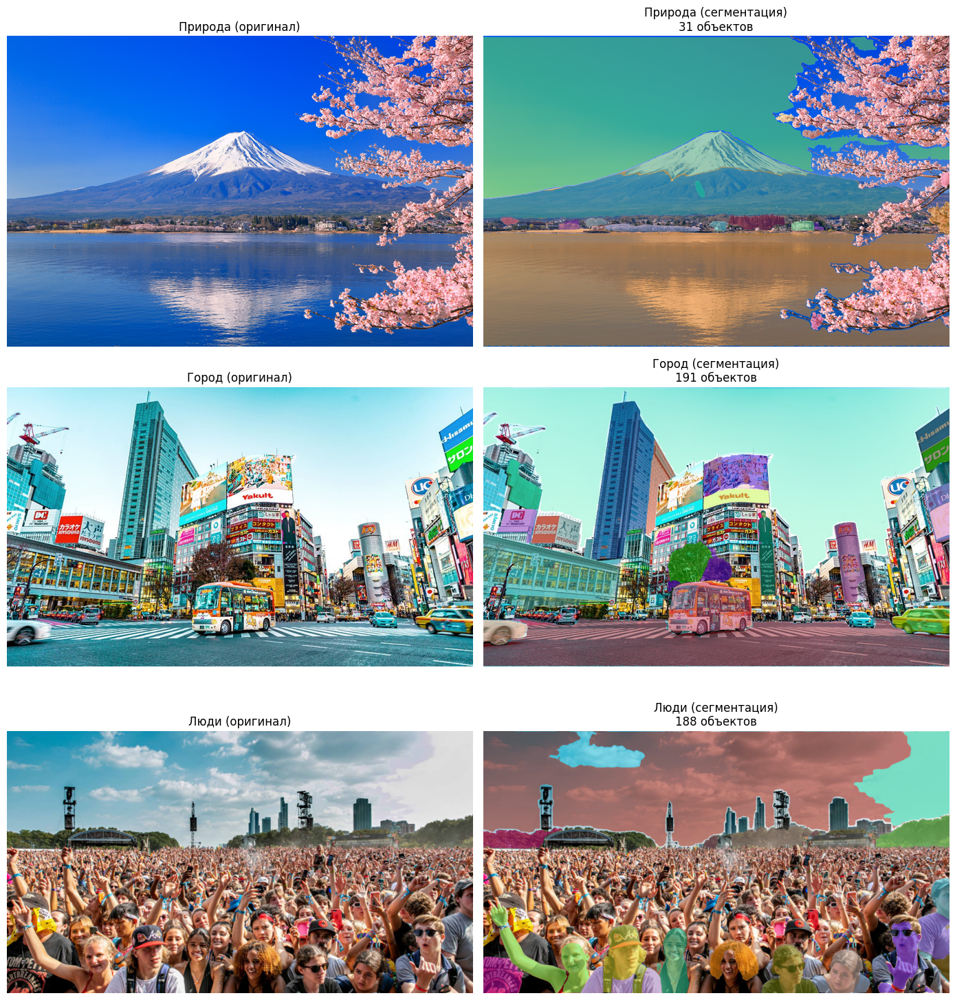

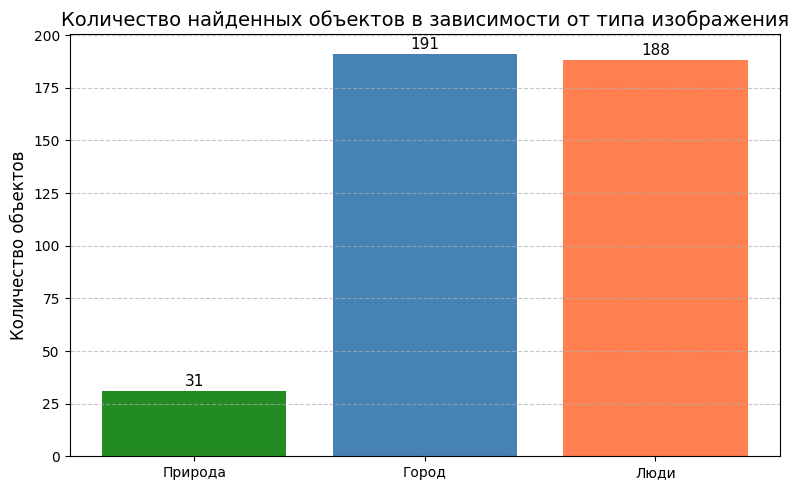


📝 ВЫВОД: На каких изображениях SAM работает лучше/хуже?

✅ ЛУЧШЕЕ КАЧЕСТВО: Природа (IoU=0.910)
   → SAM точнее всего работает на изображениях с четкими, контрастными объектами

❌ ХУДШЕЕ КАЧЕСТВО: Люди (IoU=0.907)
   → Сложности возникают при:
      • Мелких или перекрывающихся объектах
      • Неоднородном или зашумленном фоне

🔢 БОЛЬШЕ ВСЕГО ОБЪЕКТОВ: Город (191)
   → SAM находит много объектов на сценах с высокой плотностью



In [16]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import cv2

# ============================================================================
# Функция визуализации масок (из вашего примера)
# ============================================================================

def show_anns(anns, ax):
    """Отображает маски поверх изображения"""
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    
    ax.set_autoscale_on(False)
    img = np.ones((sorted_anns[0]['segmentation'].shape[0], 
                   sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    
    for ann in sorted_anns[:20]:  # Показываем топ-20 по площади
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask
    
    ax.imshow(img)


# ============================================================================
# Функция анализа одного изображения
# ============================================================================

def analyze_image(image_path, mask_generator, image_name):
    """Запускает автоматическую сегментацию и возвращает статистику."""
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    print(f"  Генерация масок для '{image_name}'...")
    masks = mask_generator.generate(image)
    
    num_objects = len(masks)
    areas = [m['area'] for m in masks]
    iou_scores = [m.get('predicted_iou', 0.0) for m in masks]
    
    total_area = sum(areas)
    image_area = image.shape[0] * image.shape[1]
    coverage = (total_area / image_area) * 100
    
    return {
        'name': image_name,
        'num_objects': num_objects,
        'mean_iou': np.mean(iou_scores) if iou_scores else 0,
        'mean_area': np.mean(areas) if areas else 0,
        'coverage': coverage,
        'masks': masks,
        'image': image
    }


# ============================================================================
# Основной запуск
# ============================================================================

# Список изображений (укажите ваши пути)
images_to_analyze = {
    "Природа": Path("./images/nature.jpg"),
    "Город": Path("./images/city.jpg"),
    "Люди": Path("./images/people.jpg"),
}

results = []
print("🚀 Начинаем анализ...\n")

for name, path in images_to_analyze.items():
    if path.exists():
        stats = analyze_image(path, mask_generator, name)
        results.append(stats)

# ============================================================================
# ВИЗУАЛИЗАЦИЯ (оригинал + сегментация для каждого изображения)
# ============================================================================

if results:
    # Вывод статистики в консоль
    print("\n" + "="*50)
    print("📊 РЕЗУЛЬТАТЫ")
    print("="*50)
    for r in results:
        print(f"{r['name']}: {r['num_objects']} объектов, IoU={r['mean_iou']:.3f}, покрытие={r['coverage']:.1f}%")
    
    # Визуализация: для каждого изображения показываем оригинал и результат сегментации
    n = len(results)
    fig, axes = plt.subplots(n, 2, figsize=(14, 5 * n))
    
    if n == 1:
        axes = axes.reshape(1, -1)
    
    for idx, res in enumerate(results):
        # Оригинальное изображение
        axes[idx, 0].imshow(res['image'])
        axes[idx, 0].set_title(f"{res['name']} (оригинал)", fontsize=12)
        axes[idx, 0].axis("off")
        
        # Изображение с сегментацией
        axes[idx, 1].imshow(res['image'])
        show_anns(res['masks'], axes[idx, 1])
        axes[idx, 1].set_title(f"{res['name']} (сегментация)\n{res['num_objects']} объектов", fontsize=12)
        axes[idx, 1].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    # ============================================================================
    # ГРАФИК: Тип изображения vs Количество объектов
    # ============================================================================
    
    names = [r['name'] for r in results]
    objects = [r['num_objects'] for r in results]
    
    plt.figure(figsize=(8, 5))
    bars = plt.bar(names, objects, color=['forestgreen', 'steelblue', 'coral'])
    plt.title('Количество найденных объектов в зависимости от типа изображения', fontsize=14)
    plt.ylabel('Количество объектов', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    for bar, val in zip(bars, objects):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                str(val), ha='center', va='bottom', fontsize=11)
    
    plt.tight_layout()
    plt.show()
    
    # ============================================================================
    # ВЫВОД
    # ============================================================================
    
    print("\n" + "="*60)
    print("📝 ВЫВОД: На каких изображениях SAM работает лучше/хуже?")
    print("="*60)
    
    best = max(results, key=lambda x: x['mean_iou'])
    worst = min(results, key=lambda x: x['mean_iou'])
    most = max(results, key=lambda x: x['num_objects'])
    
    print(f"\n✅ ЛУЧШЕЕ КАЧЕСТВО: {best['name']} (IoU={best['mean_iou']:.3f})")
    print(f"   → SAM точнее всего работает на изображениях с четкими, контрастными объектами")
    
    print(f"\n❌ ХУДШЕЕ КАЧЕСТВО: {worst['name']} (IoU={worst['mean_iou']:.3f})")
    print(f"   → Сложности возникают при:")
    print(f"      • Мелких или перекрывающихся объектах")
    print(f"      • Неоднородном или зашумленном фоне")
    
    print(f"\n🔢 БОЛЬШЕ ВСЕГО ОБЪЕКТОВ: {most['name']} ({most['num_objects']})")
    print(f"   → SAM находит много объектов на сценах с высокой плотностью")
    
    print("\n" + "="*60)

else:
    print("❌ Нет изображений для анализа. Проверьте пути в images_to_analyze.")

### Задание 3

🚀 Создаем умное размытие фона...
   Точка: [800, 500]
   Сила размытия: 10
✅ Готово! Качество маски: 0.911


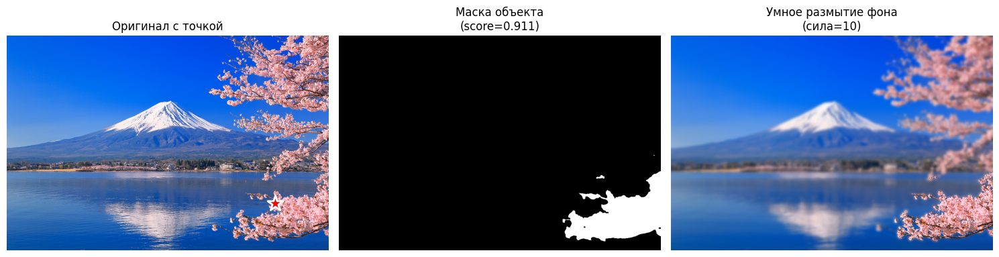

📁 Результат сохранен в ./images/smart_blur_result.jpg


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import gaussian_filter

# ============================================================================
# Функция для умного размытия фона
# ============================================================================

def smart_background_blur(image, predictor, point_coords, blur_strength=15):
    """
    Выделяет объект по точке и размывает фон.
    
    Args:
        image: изображение (numpy array RGB)
        predictor: SamPredictor (уже инициализированный)
        point_coords: координаты точки на главном объекте [x, y]
        blur_strength: сила размытия фона (чем больше, тем сильнее)
    
    Returns:
        result: изображение с размытым фоном
        mask: маска выделенного объекта
    """
    # Устанавливаем изображение в predictor
    predictor.set_image(image)
    
    # Предсказываем маску по точке
    input_point = np.array([point_coords])
    input_label = np.array([1])  # 1 = объект
    
    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True
    )
    
    # Выбираем лучшую маску (с наибольшим score)
    best_idx = np.argmax(scores)
    best_mask = masks[best_idx]
    
    # Создаем размытую версию изображения
    blurred = cv2.GaussianBlur(image, (blur_strength * 2 + 1, blur_strength * 2 + 1), 0)
    
    # Объединяем: объект остается четким, фон размыт
    result = image.copy()
    result[~best_mask] = blurred[~best_mask]
    
    return result, best_mask, scores[best_idx]

# ============================================================================
# Визуализация результатов
# ============================================================================

def visualize_blur_result(image, result, mask, point_coords, score, blur_strength):
    """Отображает оригинал, маску и результат размытия"""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Оригинал с точкой
    axes[0].imshow(image)
    axes[0].scatter(point_coords[0], point_coords[1], 
                   c='red', marker='*', s=300, edgecolor='white', linewidth=2)
    axes[0].set_title("Оригинал с точкой", fontsize=12)
    axes[0].axis("off")
    
    # Маска объекта
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title(f"Маска объекта\n(score={score:.3f})", fontsize=12)
    axes[1].axis("off")
    
    # Результат с размытым фоном
    axes[2].imshow(result)
    axes[2].set_title(f"Умное размытие фона\n(сила={blur_strength})", fontsize=12)
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()


# ============================================================================
# ПРИМЕР ИСПОЛЬЗОВАНИЯ
# ============================================================================

# Загружаем изображение (укажите ваш путь)
image_path = "./images/nature.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Координаты точки на главном объекте (укажите вручную)
# Например, для человека: точка на лице или в центре туловища
point_on_object = [800, 500]  # [x, y]

# Сила размытия
blur_strength = 10

# Применяем эффект
print("🚀 Создаем умное размытие фона...")
print(f"   Точка: {point_on_object}")
print(f"   Сила размытия: {blur_strength}")

result, mask, score = smart_background_blur(
    image, predictor, point_on_object, blur_strength
)

print(f"✅ Готово! Качество маски: {score:.3f}")

# Визуализация
visualize_blur_result(image, result, mask, point_on_object, score, blur_strength)

# Сохранение результата
output_path = "./images/smart_blur_result.jpg"
result_bgr = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
cv2.imwrite(output_path, result_bgr)
print(f"📁 Результат сохранен в {output_path}")